**Basic Imports**

In [2]:
import geopandas as gpd
import pandas as pd
import dask.dataframe as dd

import numpy as np
from shapely.geometry import Polygon, MultiPolygon
from IPython.display import display, display_html
%matplotlib inline

def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+= "&emsp;" + df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

# Download Data

To download all neccessary data for this notebook, please run the following cell:

In [6]:
import os
import requests
import os
from multiprocessing.dummy import Pool
from functools import partial
import zipfile

def download_file(url, export_directory="", filename=None):
    print("Download file %s to directory %s"%(url, export_directory))
    if filename ==  None:
        local_filename = os.path.join(export_directory,url.split('/')[-1])
    else:
        local_filename = os.path.join(export_directory,filename)
    # NOTE the stream=True parameter
    r = requests.get(url, stream=True)
    with open(local_filename, 'wb') as f:
        for chunk in r.iter_content(chunk_size=1024):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)
                #f.flush() commented by recommendation from J.F.Sebastian
    return local_filename

#Create Folders for Data:
if not os.path.exists("Data"):
    os.mkdir("Data")

if not os.path.exists(os.path.join("Data","New York Taxi")):
    os.mkdir(os.path.join("Data","New York Taxi"))

if not os.path.exists(os.path.join("Data","OSM GPX")):
    os.mkdir(os.path.join("Data","OSM GPX"))

#Download New York Taxi Data for Yellow Cabs in 2017:
download_taxi_data = partial(download_file, export_directory=os.path.join("Data","New York Taxi"))
request_strings = [r"https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2017-%02d.csv"%i for i in range(1,13)]
pool = Pool(processes=4)
pool.map(download_taxi_data, request_strings)

#Download New York Taxi Data for Green Cabs in 2017:
download_taxi_data = partial(download_file, export_directory=os.path.join("Data","New York Taxi"))
request_strings = [r"https://s3.amazonaws.com/nyc-tlc/trip+data/green_tripdata_2017-%02d.csv"%i for i in range(1,13)]
pool = Pool(processes=4)
pool.map(download_taxi_data, request_strings)

#Download shapefile of New York Taxi Zones:
print("Download Taxi Zones Shapefiles.")
zip_path = download_taxi_data(r"https://s3.amazonaws.com/nyc-tlc/misc/taxi_zones.zip")
print("Unzip Taxi Zones Shapefiles.")
with zipfile.ZipFile(zip_path, "r") as z:
    z.extractall(os.path.dirname(zip_path))
os.remove(zip_path)

#Download OSM path data:
osm_path = download_file(r"https://ptv2box.ptvgroup.com/index.php/s/9sTUmxdF80NU2nr/download", export_directory=os.path.join("Data","OSM GPX"), filename="OSM_GPX.parquet")

Download file https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2017-01.csv to directory Data\New York Taxi
Download file https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2017-02.csv to directory Data\New York Taxi
Download file https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2017-03.csv to directory Data\New York TaxiDownload file https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2017-04.csv to directory Data\New York Taxi

Download file https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2017-05.csv to directory Data\New York Taxi
Download file https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2017-06.csv to directory Data\New York Taxi
Download file https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2017-07.csv to directory Data\New York Taxi
Download file https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2017-08.csv to directory Data\New York Taxi
Download file https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_

# Interactive Maps for New York Taxi Data 2017

## New York Taxi zones

In this section, we will load an process the shapefile **"taxi_zones.shp"** containing the New York Taxis Zones, such that we can use them as a basis for the **Bokeh** plot. In the next cell, we use GeoPandas to load the shapefile of Taxi zones and transform coordinate system to Web Mercador (<a href="http://spatialreference.org/ref/sr-org/epsg3857-wgs84-web-mercator-auxiliary-sphere/">EPSG-Code</a> of Web Mercador Projection = 3785 ):

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,POLYGON ((-8258175.532737542 4967457.202997509...
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,(POLYGON ((-8217980.621910946 4959237.28547656...
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,POLYGON ((-8220713.534155371 4993383.154023493...
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,POLYGON ((-8234500.226961648 4971984.093402824...
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((-8257036.1088425 4948033.094994311, ..."


Number of Polygons: 263


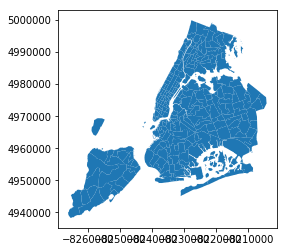

In [7]:
df_taxizones = gpd.read_file(r"Data\New York Taxi\taxi_zones.shp")
df_taxizones.to_crs(epsg=3785, inplace=True)     #EPSG-Code of Web Mercador
display(df_taxizones.head())
print("Number of Polygons: %d"%len(df_taxizones))
df_taxizones.plot()

Simplify Shape of Zones (otherwise slow peformance of plot):

In [8]:
df_taxizones["geometry"] = df_taxizones["geometry"].simplify(100)

Convert WKT Polygons to X and Y arrays with corresponding coordinates. Take into account **multipolygons** and separate them into individual shapes:

In [9]:
data = []
for zonename, LocationID, borough, shape in df_taxizones[["zone", "LocationID", "borough", "geometry"]].values:
    #If shape is polygon, extract X and Y coordinates of boundary line:
    if isinstance(shape, Polygon):
        X, Y = shape.boundary.xy
        X = [int(x) for x in X]
        Y = [int(y) for y in Y]
        data.append([LocationID, zonename, borough, X, Y])
        
    #If shape is Multipolygon, extract X and Y coordinates of each sub-Polygon:
    if isinstance(shape, MultiPolygon):
        for poly in shape:
            X, Y = poly.boundary.xy
            X = [int(x) for x in X]
            Y = [int(y) for y in Y]
            data.append([LocationID, zonename, borough, X, Y])

#Create new DataFrame with X an Y coordinates separated:
df_taxizones = pd.DataFrame(data, columns=["LocationID", "ZoneName", "Borough", "X", "Y"])
display(df_taxizones.head())
print("Number of Polygons: %d"%len(df_taxizones))

,LocationID,ZoneName,Borough,X,Y
0,1,Newark Airport,EWR,"[-8258175, -8257996, -8257196, -8255544, -8254...","[4967457, 4968700, 4969275, 4969313, 4968967, ..."
1,2,Jamaica Bay,Queens,"[-8217980, -8217724, -8217172, -8217481, -8217...","[4959237, 4957879, 4957127, 4956837, 4956670, ..."
2,2,Jamaica Bay,Queens,"[-8220634, -8220787, -8221897, -8221627, -8220...","[4958207, 4957938, 4957986, 4958664, 4959199, ..."
3,2,Jamaica Bay,Queens,"[-8214908, -8215168, -8215186, -8214355, -8214...","[4958235, 4958071, 4958102, 4958551, 4958235]"
4,2,Jamaica Bay,Queens,"[-8219412, -8219953, -8220327, -8220101, -8219...","[4958081, 4957120, 4957896, 4958143, 4958335, ..."


Number of Polygons: 354


## New York Taxi Data

Here, we read in the data from New York Taxis and aggregate them to show us information about how frequent each taxi zone is visited. We will use Dask.DataFrame, such that the whole dataset can be loaded at once without blowing up our memory and to get a nice speedup due to the parallelizm of Dask. Let us start a Dask Client and Local Cluster (after the execution of the cell, click on the **Dashboard Link** to view the Dask Dashboard, where you can see the resource consumption of our computation

In [10]:
from dask.distributed import Client, LocalCluster
import dask.dataframe as dd
from dask import compute

cluster = LocalCluster()
print(cluster)
client = Client(cluster)
client

LocalCluster('tcp://127.0.0.1:49642', workers=8, ncores=8)


Client Scheduler: tcp://127.0.0.1:49642 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 8 Cores: 8 Memory: 34.21 GB


Using Dask, we now read in the New York Taxi Data for the yellow and green cabs into  distributed DataFrames. Note: A **Dask.DataFrame** is a *delayed object* and to calculate results, one has to trigger the computation via the **.compute()** method.

In [11]:
df_taxis_yellow = dd.read_csv(r"Data\New York Taxi\yellow_tripdata_2017-*.csv", 
                       usecols=["tpep_pickup_datetime", "tpep_dropoff_datetime", "passenger_count",
                               "PULocationID", "DOLocationID"],
                       parse_dates=["tpep_pickup_datetime", "tpep_dropoff_datetime"])
df_taxis_green = dd.read_csv(r"Data\New York Taxi\green_tripdata_2017-*.csv", 
                       usecols=["lpep_pickup_datetime", "lpep_dropoff_datetime", "passenger_count",
                               "PULocationID", "DOLocationID"],
                       parse_dates=["lpep_pickup_datetime", "lpep_dropoff_datetime"]).rename(
                        columns = {"lpep_pickup_datetime": "tpep_pickup_datetime", 
                                   "lpep_dropoff_datetime": "tpep_dropoff_datetime"})
df_taxis = dd.concat([df_taxis_yellow, df_taxis_green])

#Filter data for correct year :
df_taxis = df_taxis[(df_taxis["tpep_pickup_datetime"].dt.year == 2017)&(df_taxis["tpep_dropoff_datetime"].dt.year == 2017)]

df_taxis.head()

C:\ProgramData\Anaconda3\envs\Python27_PyCon\lib\site-packages\dask\dataframe\methods.py:295: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  for df in dfs3], join=join).any()
C:\ProgramData\Anaconda3\envs\Python27_PyCon\lib\site-packages\dask\dataframe\methods.py:329: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  out = pd.concat(dfs3, join=join)


,DOLocationID,PULocationID,passenger_count,tpep_dropoff_datetime,tpep_pickup_datetime
0,161,263,1,2017-01-09 11:25:45,2017-01-09 11:13:28
1,234,186,1,2017-01-09 11:36:01,2017-01-09 11:32:27
2,161,164,1,2017-01-09 11:42:05,2017-01-09 11:38:20
3,75,236,1,2017-01-09 11:57:36,2017-01-09 11:52:13
4,234,249,1,2017-01-01 00:00:00,2017-01-01 00:00:00


Now, we calculate the number of boarding and alighting passengers for each zone and every hour and every day using the **GroupBy** Method. For this, we first create two columns specifying the hour and daytype of Pickup and Dropoff. Then, we define the groupby operations for Pickups and Dropoffs: and finally we trigger the parallelized computation using **dask.compute**:

In [12]:
df_taxis["Pickup_Hour"] = df_taxis["tpep_pickup_datetime"].dt.hour
df_taxis["Dropoff_Hour"] = df_taxis["tpep_dropoff_datetime"].dt.hour
df_taxis["weekday"] = df_taxis["tpep_dropoff_datetime"].dt.weekday
pickups = df_taxis.groupby(by=["Pickup_Hour", "weekday", "PULocationID"])["passenger_count"].sum()
dropoffs = df_taxis.groupby(by=["Dropoff_Hour", "weekday", "DOLocationID"])["passenger_count"].sum()
pickups, dropoffs = compute(pickups, dropoffs)

**Time Series of Pickups and Dropoffs**

Aggregate Pickups and Dropoffs hourly:

In [13]:
df_pudo = pd.DataFrame(pickups.groupby(level=0).sum())
df_pudo["Dropoff"] = dropoffs.groupby(level=0).sum()
df_pudo.columns = ["P", "D"]
df_pudo.index.rename("Hour", inplace=True)
df_pudo.head(3)

,P,D
Hour,,
0,7003097,7637514
1,5124047,5535721
2,3715458,3982952


Plot with Holoviews (Backend: Bokeh)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
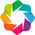

In [14]:
import holoviews as hv
hv.extension('bokeh')

In [15]:
%%opts Bars.Grouped [group_index='Group' toolbar='above' tools=['hover'] width=800]
from itertools import product
hours, groups = df_pudo.index.values, ['P', 'D']
keys = product(hours, groups)
bars = hv.Bars([(hour, pudo, df_pudo.loc[hour, pudo]) for hour, pudo in keys],
               ['Hour', "Group"], "Passengers")
bars.relabel(group='Grouped')

:Bars   [Hour,Group]   (Passengers)

**Finally, join the Taxi Zones DataFrame with the information about the Pickups and Dropoffs for every hour and weekday:**

In [16]:
display_side_by_side(pd.DataFrame(pickups).head(), df_taxizones[["LocationID", "ZoneName", "X"]].head())

passenger_count 
 
 
 Pickup_Hour 
 weekday 
 PULocationID 
 
 
 
 
 
 0 
 0 
 4 
 1594 
 
 
 17 
 1403 
 
 
 24 
 1401 
 
 
 36 
 811 
 
 
 43 
 2670 
 
 
   
 
 
 
 LocationID 
 ZoneName 
 X 
 
 
 
 
 0 
 1 
 Newark Airport 
 [-8258175, -8257996, -8257196, -8255544, -8254... 
 
 
 1 
 2 
 Jamaica Bay 
 [-8217980, -8217724, -8217172, -8217481, -8217... 
 
 
 2 
 2 
 Jamaica Bay 
 [-8220634, -8220787, -8221897, -8221627, -8220... 
 
 
 3 
 2 
 Jamaica Bay 
 [-8214908, -8215168, -8215186, -8214355, -8214... 
 
 
 4 
 2 
 Jamaica Bay 
 [-8219412, -8219953, -8220327, -8220101, -8219...

In [17]:
pickups = pd.DataFrame(pickups)
dropoffs = pd.DataFrame(dropoffs)

for hour in range(24):
    
    for weekday in range(7):
    
        #Get pickups and dropoff for this hour and weekday:
        p = pd.DataFrame(pickups.loc[(hour, weekday)]).reset_index().rename(columns={"PULocationID" : "LocationID"})
        d = pd.DataFrame(dropoffs.loc[(hour, weekday)]).reset_index().rename(columns={"DOLocationID" : "LocationID"})

        #Add information of pickups and dropoff to the New York Taxi Zone DataFrame:
        df_taxizones = pd.merge(df_taxizones, p, on="LocationID", how="left").fillna(0)
        df_taxizones.rename(columns={"passenger_count" : "PU_Passenger_%d_%d"%(weekday, hour)}, inplace=True) 
        df_taxizones = pd.merge(df_taxizones, d, on="LocationID", how="left").fillna(0)
        df_taxizones.rename(columns={"passenger_count" : "DO_Passenger_%d_%d"%(weekday, hour)}, inplace=True)
        
df_taxizones.head(2)      

C:\ProgramData\Anaconda3\envs\Python27_PyCon\lib\site-packages\ipykernel_launcher.py:9: PerformanceWarning: indexing past lexsort depth may impact performance.
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\envs\Python27_PyCon\lib\site-packages\ipykernel_launcher.py:10: PerformanceWarning: indexing past lexsort depth may impact performance.
  # Remove the CWD from sys.path while we load stuff.


,LocationID,ZoneName,Borough,X,Y,PU_Passenger_0_0,DO_Passenger_0_0,PU_Passenger_1_0,DO_Passenger_1_0,PU_Passenger_2_0,...,PU_Passenger_2_23,DO_Passenger_2_23,PU_Passenger_3_23,DO_Passenger_3_23,PU_Passenger_4_23,DO_Passenger_4_23,PU_Passenger_5_23,DO_Passenger_5_23,PU_Passenger_6_23,DO_Passenger_6_23
0,1,Newark Airport,EWR,"[-8258175, -8257996, -8257196, -8255544, -8254...","[4967457, 4968700, 4969275, 4969313, 4968967, ...",7.0,107.0,9.0,82.0,5.0,...,12.0,144.0,5.0,154.0,11.0,225.0,12.0,114.0,19.0,124.0
1,2,Jamaica Bay,Queens,"[-8217980, -8217724, -8217172, -8217481, -8217...","[4959237, 4957879, 4957127, 4956837, 4956670, ...",2.0,0.0,1.0,0.0,0.0,...,0.0,5.0,0.0,0.0,5.0,5.0,7.0,0.0,0.0,0.0


## Plot Interactive Demand Map using Bokeh

### Draw Taxi Zones on Map

Bokeh Imports

In [18]:
from bokeh.io import output_notebook, output_file, show
from bokeh.plotting import figure
from bokeh.models import HoverTool, Select, ColumnDataSource, WheelZoomTool, LogColorMapper, LinearColorMapper
from bokeh.palettes import OrRd9 as palette
output_notebook()

Loading BokehJS ...

Define Source for Plot. Bokeh, like its high-level API Holoviews, can convert dicts and DataFrames to a ColumnDataSource. Its columns can than be used to specify, what should be plotted.

In [19]:
df_taxizones["Passengers"] = df_taxizones["PU_Passenger_0_7"]
source = ColumnDataSource(df_taxizones)

Define Colormapper for zones

In [20]:
max_passengers_per_hour = df_taxizones[filter(lambda x: "Passenger_" in x, df_taxizones.columns)].max().max()
color_mapper = LinearColorMapper(palette=palette[::-1], high=max_passengers_per_hour, low=0)

Define Figure

In [21]:
p = figure(title="Titel",
           plot_width=900, plot_height=450,
           toolbar_location=None,
           tools="pan,wheel_zoom,box_zoom,reset,save",
           active_scroll="wheel_zoom")
p.xaxis.visible = False
p.yaxis.visible = False

#Get rid of zoom on axes:
for t in p.tools:
    if type(t) == WheelZoomTool:
        t.zoom_on_axis = False

Add Background Map (Custom Tile-Maps: http://geo.holoviews.org/Working_with_Bokeh.html)

In [22]:
from bokeh.models import WMTSTileSource

#Use OpenStreetMap Tiles:
tiles = WMTSTileSource(url='http://c.tile.openstreetmap.org/{Z}/{X}/{Y}.png')

#Add Tile Layer and set alpha-value:
tile_layer = p.add_tile(tiles)
tile_layer.alpha = 0.6

Draw Taxi Zone Polygons on the Map. Pass the ColumnDataSource as **source**, such you can use the column names to pass data to the renderer. We use the **Passengers** column to draw a <a href="https://en.wikipedia.org/wiki/Choropleth_map">Choropleth map</a>. 

In [23]:
patches = p.patches(xs="X", ys="Y", source=source,
                  fill_color={'field': 'Passengers', 'transform': color_mapper},
                  line_color="black", alpha=0.5)
show(p)

Add the Hovertool to show data of each zone (the attributes of the selected zone can be accessed by the **@** key): 

In [24]:
#Add Hover Tool:
hovertool = HoverTool(tooltips=[("Passengers:", "@Passengers")])
p.add_tools(hovertool)

show(p)

Add more advanced Hover Tools via HTML:

In [25]:
#Add Hovertool via HTML:
hovertool = HoverTool(tooltips="""
<head>
<style>
#demo {
background-color:  rgba(255,255,255, .9);  
-moz-box-shadow: inset 0 0 15px 5px rgba(200,200,200, .9);
-webkit-box-shadow: inset 0 0 15px 5px rgba(200,200,200, .9);
box-shadow: inset 0 0 15px 5px rgba(200,200,200, .9);
border-radius: 5px;
-moz-border-radius: 5px;
-webkit-border-radius: 5px;
}
</style>
</head>


<div id="demo">
<h2 style="text-align: center;">@ZoneName</h2>
<h3 style="text-align: center;">@Borough</h3>
<h4 style="text-align: center;">@Passengers Passengers</h4>
<p><img style="width: 100px; height: auto; display: block; margin-left: auto; margin-right: auto;"src="https://pbs.twimg.com/profile_images/426051037577760768/2d7K9aJc_400x400.jpeg" alt="Country Flag" /></p>
</div>""")
p.add_tools(hovertool)

show(p)

### Add Interactivity

Add Slider widget for selecting the hour of the day:

In [26]:
from bokeh.models.widgets import Slider

slider = Slider(start=0, end=23, value=7, step=1, title="Hour", width=600)

show(slider)

Add RadioButton widgets for selecting (Pickups/Dropoffs) and the weekday:

In [27]:
from bokeh.models.widgets import RadioButtonGroup, Div
from bokeh.layouts import column, row

radiobuttons_weekday = RadioButtonGroup(
    labels=["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    active=0,
    width=400)

radiobuttons_pudo = RadioButtonGroup(
        labels=["Pickups", "Dropoff"], active=0)

layout_widgets = column(slider, row(radiobuttons_weekday, Div(width=80), radiobuttons_pudo))

show(layout_widgets)

Add Interaction via JavaScript Callback:

In [28]:
from bokeh.models.callbacks import CustomJS

#Define callback-function with JavaScript Code:
callback = CustomJS(args=dict(p=p, source=source, slider=slider, 
                              radiobuttons_pudo=radiobuttons_pudo, 
                              radiobuttons_weekday=radiobuttons_weekday),
                    code="""
                    
//Get value of slider for hour:
var hour = slider.value;

//Get value of weekday:
var weekday = radiobuttons_weekday.active;

//Get value of Pickups/Dropoffs RadioButtons:
if (radiobuttons_pudo.active == 0)
    var pudo = "PU"
else
    var pudo = "DO"

//Change data of "Passengers" column in data source to passenger data of the selected hour:
source.data["Passengers"] = source.data[pudo + "_Passenger_" + weekday + "_" + hour];
source.change.emit();
                    
                    """)

#Bind Callback to value change of slider and radiobuttons:
slider.js_on_change("value", callback)
radiobuttons_pudo.js_on_change("active", callback)
radiobuttons_weekday.js_on_change("active", callback)

#Show all elements:
layout = column( layout_widgets , p)
show(layout)

Change to logarithmic Colormapper (to see patterns in zones with low demand):

In [29]:
color_mapper_log = LogColorMapper(palette=palette[::-1], high=max_passengers_per_hour, low=0)
patches.glyph.fill_color["transform"] = color_mapper_log
show(layout)

### Dropoff and Pickup Zones

To clearly see the structure of the Taxi transport flow for each cell, let us look at the difference between Pickups and Dropoffs in a zone. If this is a positive number, more people leave the zone than enter it:

In [30]:
df_pudo = df_taxizones.copy()

for hour in range(24):
    for weekday in range(7):
        df_pudo["PUDO_%d_%d"%(weekday, hour)] = df_pudo["PU_Passenger_%d_%d"%(weekday, hour)] - df_pudo["DO_Passenger_%d_%d"%(weekday, hour)]
        df_pudo["PUDO_%d_%d"%(weekday, hour)] = df_pudo["PUDO_%d_%d"%(weekday, hour)].apply(lambda x: "PU > DO" if x>0 else "PU < DO")
df_pudo.drop(columns=filter(lambda x: "Passenger" in x, df_pudo.columns), inplace=True)
df_pudo["PUDO"] = df_pudo["PUDO_0_7"]
df_pudo.head(3)

,LocationID,ZoneName,Borough,X,Y,PUDO_0_0,PUDO_1_0,PUDO_2_0,PUDO_3_0,PUDO_4_0,...,PUDO_5_22,PUDO_6_22,PUDO_0_23,PUDO_1_23,PUDO_2_23,PUDO_3_23,PUDO_4_23,PUDO_5_23,PUDO_6_23,PUDO
0,1,Newark Airport,EWR,"[-8258175, -8257996, -8257196, -8255544, -8254...","[4967457, 4968700, 4969275, 4969313, 4968967, ...",PU < DO,PU < DO,PU < DO,PU < DO,PU < DO,...,PU < DO,PU < DO,PU < DO,PU < DO,PU < DO,PU < DO,PU < DO,PU < DO,PU < DO,PU < DO
1,2,Jamaica Bay,Queens,"[-8217980, -8217724, -8217172, -8217481, -8217...","[4959237, 4957879, 4957127, 4956837, 4956670, ...",PU > DO,PU > DO,PU < DO,PU < DO,PU < DO,...,PU < DO,PU > DO,PU < DO,PU > DO,PU < DO,PU < DO,PU < DO,PU > DO,PU < DO,PU < DO
2,2,Jamaica Bay,Queens,"[-8220634, -8220787, -8221897, -8221627, -8220...","[4958207, 4957938, 4957986, 4958664, 4959199, ...",PU > DO,PU > DO,PU < DO,PU < DO,PU < DO,...,PU < DO,PU > DO,PU < DO,PU > DO,PU < DO,PU < DO,PU < DO,PU > DO,PU < DO,PU < DO


In [31]:
from bokeh.transform import factor_cmap

#Define Categorical Color Map for Plot (red="PU > DO", blue="PU < DO"):
categorical_cmap = factor_cmap("PUDO", palette=["red", "blue"], factors=["PU > DO", "PU < DO"] )

#Define Source for Plot:
source = ColumnDataSource(df_pudo)

#Define Figure for Plot:
p = figure(title="Titel",
           plot_width=900, plot_height=450,
           toolbar_location=None,
           tools="pan,wheel_zoom,box_zoom,reset,save",
           active_scroll="wheel_zoom")
p.xaxis.visible = False
p.yaxis.visible = False

#Get rid of zoom on axes:
for t in p.tools:
    if type(t) == WheelZoomTool:
        t.zoom_on_axis = False

#Use OpenStreetMap Tiles:
tiles = WMTSTileSource(url='http://c.tile.openstreetmap.org/{Z}/{X}/{Y}.png')

#Add Tile Layer and set alpha-value:
tile_layer = p.add_tile(tiles)
tile_layer.alpha = 0.6

patches = p.patches(xs="X", ys="Y", source=source,
                  fill_color=categorical_cmap,
                  line_color="black", alpha=0.5,
                  legend="PUDO")


slider = Slider(start=0, end=23, value=7, step=1, title="Hour", width=350)

radiobuttons_weekday = RadioButtonGroup(
    labels=["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    active=0,
    width=350)

#Define callback-function with JavaScript Code:
callback = CustomJS(args=dict(p=p, source=source, slider=slider,
                              radiobuttons_weekday=radiobuttons_weekday),
                    code="""
                    
//Get value of slider for hour:
var hour = slider.value;

//Get value of weekday:
var weekday = radiobuttons_weekday.active;

//Change data of "PUDO" column in data source to passenger data of the selected hour:
source.data["PUDO"] = source.data["PUDO_" + weekday + "_" + hour];
source.change.emit();

                    """)

#Bind Callback to value change of slider and radiobuttons:
slider.js_on_change("value", callback)
radiobuttons_weekday.js_on_change("active", callback)

show(column(row(slider, Div(width=100), radiobuttons_weekday), p))

# OSM GPS Data and Datashader

## Load and process data

Use GPX Dataset for Germany (only identifiable trips) from <a href="https://wiki.openstreetmap.org/wiki/Planet.gpx">OpenStreetMap</a> (**© OpenStreetMap-Mitwirkende**). From the GPX files a final DataFrame (only containing Latitude and Longitude) was created. Let us load the data into the DataFrame: 

**Note**: The <a href="https://www.openstreetmap.org/copyright">OSM Licence Conditions</a> also apply to the provided data. 

In [32]:
df_osm = pd.read_parquet("Data\OSM GPX\OSM_GPX.parquet")
display_side_by_side(df_osm.query("TripId==1").head(), df_osm.query("TripId==2").head())

,latitude,longitude,TripId
687,51.429875,7.135787,1
688,51.429956,7.135593,1
689,51.430018,7.135462,1
690,51.430084,7.135334,1
691,51.430150,7.135200,1
,latitude,longitude,TripId
2912,51.440173,7.134895,2
2913,51.440242,7.135036,2
2914,51.440293,7.135201,2
2915,51.440339,7.135333,2


Calculate distances between the GPS points of a trip:

In [33]:
def calc_distance_from_lonlat(x1, y1, x2, y2):
    """Calculates the distance between two points in WGS84 projection (Lat, Lon)
       based on a linear approximation around the origin of the first point. Works 
       well for smaller distances < 100km.   
       """

    return np.sqrt((np.cos(y1 * 2 * np.pi / 360) * (x2 - x1))**2 +
                   (y2 - y1)**2) * 6371 * 2 * np.pi / 360

#Calculate postlength of every GPS point:
df_osm["Postlength"] = calc_distance_from_lonlat(df_osm["longitude"], df_osm["latitude"], df_osm["longitude"].shift(-1), df_osm["latitude"].shift(-1))
#Set Postlength of every last element of each trip to NaN:
df_osm.loc[df_osm["TripId"]-df_osm["TripId"].shift(-1)!=0, "Postlength"] = np.NaN

display_side_by_side(df_osm.query("TripId==1").head(), df_osm.query("TripId==1").tail())

,latitude,longitude,TripId,Postlength
687,51.429875,7.135787,1,0.016187
688,51.429956,7.135593,1,0.011402
689,51.430018,7.135462,1,0.011515
690,51.430084,7.135334,1,0.011839
691,51.430150,7.135200,1,0.014155
,latitude,longitude,TripId,Postlength
2907,51.435029,7.140473,1,0.019893
2908,51.434863,7.140366,1,0.012915
2909,51.434762,7.140274,1,0.011926
2910,51.434673,7.140178,1,0.005040


## Basic Plots

**Let us quickly create some easy plots with basic statistics about the GPS data**

Histogram with number of points per trip:

In [34]:
%%output filename="Export/Trip_points" fig="html"
%%opts Histogram [width=500 tools=['hover']]
%%opts Histogram (fill_color='red')

#Count Number of Points for every trip:
trip_points = df_osm.groupby("TripId")["latitude"].count().values
#Calculate 90 percent quantile for setting plotting range:
quantile_90 = np.percentile(trip_points, 90)

#Plot Histogram via Holoviews (output to Data/Trip_points due to the %%magic command in the top of the cell):
frequencies, edges = np.histogram(trip_points, np.arange(0, trip_points.max()+100, 100))
p_trip_points = hv.Histogram((edges, frequencies), label="Number of GPS Points per Trip")
p_trip_points = p_trip_points.redim.label(x="Number of Points", Frequency="Trips")
p_trip_points = p_trip_points.redim.range(x=(0,quantile_90))
p_trip_points

:Histogram   [x]   (Frequency)

Trip length distribution 

In [35]:
%%output filename="Export/Trip_lengths" fig="html"
%%opts Histogram [width=500 tools=['hover']]
%%opts Histogram (fill_color='red')

#Count Number of Points for every trip:
trip_length = df_osm.groupby("TripId")["Postlength"].sum().values
#Calculate 90 percent quantile for setting plotting range:
quantile_90 = np.percentile(trip_length, 90)

#Plot Histogram via Holoviews (output to Data/Trip_points due to the %%magic command in the top of the cell):
frequencies, edges = np.histogram(trip_length, np.arange(0, 1000, 1))
p_trip_length = hv.Histogram((edges, frequencies), label="Trip Distances")
p_trip_length = p_trip_length.redim.label(x="Length [km]", Frequency="Trips")
p_trip_length = p_trip_length.redim.range(x=(0,quantile_90))

p_trip_length

:Histogram   [x]   (Frequency)

## Heatmap with DataShader

Add coordinates in Web Mercador:

In [36]:
from pyproj import Proj, transform

#Define initial and output Projection (WGS84 and Web-Mercador):
inProj = Proj(init='epsg:4326')
outProj = Proj(init='epsg:3857')

#Add Web Mercador coordinates to columns X, Y
df_osm["X"], df_osm["Y"] = transform(inProj, outProj, df_osm["longitude"].values, df_osm["latitude"].values)

df_osm.head()

,latitude,longitude,TripId,Postlength,X,Y
0,51.426710,7.142503,0,0.013560,795099.796949,6.697124e+06
1,51.426789,7.142354,0,0.011669,795083.210345,6.697138e+06
2,51.426708,7.142247,0,0.014729,795071.299160,6.697123e+06
3,51.426688,7.142037,0,0.011999,795047.922067,6.697120e+06
4,51.426736,7.141882,0,0.013343,795030.667546,6.697128e+06


Filter data with Germany Bounding-Box:

In [37]:
minlat, maxlat, minlon, maxlon =  47.3, 55, 5.9, 15.1            #Bounding Box Germany
#maxlat, minlon, minlat, maxlon =  52.57, 13.25, 52.45, 13.5     #Bounding Box Berlin City
df_osm_filtered = df_osm[(df_osm["latitude"]>minlat)&(df_osm["latitude"]<maxlat)&(df_osm["longitude"]>minlon)&(df_osm["longitude"]<maxlon)].copy()

Plot Heatmap of GPS Data using DataShader. Underlay heatmap with OSM map using GeoViews:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
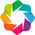

In [38]:
import holoviews as hv
import geoviews as gv
from colorcet import fire
from holoviews.operation.datashader import datashade
hv.extension('bokeh')

In [39]:
%%output filename="Export//Heatmap" fig="html"

#Define size of image:
width = 1000
height = 600

#Define sampling size of DataShader aggregation:
x_sampling = int((df_osm_filtered["X"].max()-df_osm_filtered["X"].min())/width)
y_sampling = int((df_osm_filtered["Y"].max()-df_osm_filtered["Y"].min())/height)

#Define DataShader Heatmap and Background Map Tiles:
tile_opts  = dict(width=width,height=height,xaxis=None,yaxis=None,bgcolor='black',show_grid=False)
map_tiles  = gv.WMTS('http://c.tile.openstreetmap.org/{Z}/{X}/{Y}.png').opts(style=dict(alpha=0.5), plot=tile_opts)
points     = hv.Points(df_osm_filtered, ['X', 'Y'])
trips      = datashade(points, x_sampling=1, y_sampling=1, cmap=fire, width=width, height=width)

#Combine DataShader Heatmap and Background Map Tiles:
p = map_tiles * trips

#Set wheelzoom active
def set_active_tool(plot, element):
    plot.state.toolbar.active_scroll = plot.state.tools[3]
p = p.options(finalize_hooks=[set_active_tool])

p

:DynamicMap   []
   :Overlay
      .WMTS.I :WMTS   [Longitude,Latitude]
      .RGB.I  :RGB   [X,Y]   (R,G,B,A)

## Embed Interactive Plots in HTML Template

The generated analysis and plots can be either put together like seen in the section about the New York Taxis zones, or one might use an **HTML Template** to embed the plots and data. Here, we use the Jinja package to easily embed the analysis. Let us first create some basic stats for an **Overview Page**:

In [40]:
overview_table = []
overview_table.append(dict(key="Source", value='<a href="https://wiki.openstreetmap.org/wiki/Planet.gpx">Open Street Map (Planet GPX)</a>'))
overview_table.append(dict(key="Minimum Latitude", value=df_osm["latitude"].min().round(5))) 
overview_table.append(dict(key="Maximum Latitude", value=df_osm["latitude"].max().round(5))) 
overview_table.append(dict(key="Minimum Longitude", value=df_osm["longitude"].min().round(5))) 
overview_table.append(dict(key="Maximum Longitude", value=df_osm["longitude"].max().round(5)))
overview_table.append(dict(key="Number of Trips", value=len(df_osm["TripId"].unique()))) 
overview_table.append(dict(key="Number of GPS Points", value=len(df_osm)))
overview_table.append(dict(key="Average number of GPS points per trip", value=len(df_osm)/len(df_osm["TripId"].unique())))
overview_table.append(dict(key="Average distance per trip", value="%d km"%trip_length.mean()))

overview_table

[{'key': 'Source',
  'value': '<a href="https://wiki.openstreetmap.org/wiki/Planet.gpx">Open Street Map (Planet GPX)</a>'},
 {'key': 'Minimum Latitude', 'value': 41.99002},
 {'key': 'Maximum Latitude', 'value': 59.05996},
 {'key': 'Minimum Longitude', 'value': -11.27881},
 {'key': 'Maximum Longitude', 'value': 23.87998},
 {'key': 'Number of Trips', 'value': 33396},
 {'key': 'Number of GPS Points', 'value': 89037787},
 {'key': 'Average number of GPS points per trip', 'value': 2666},
 {'key': 'Average distance per trip', 'value': '743 km'}]

Load Interactive Plots as HTML:

In [41]:
with open("Export/Trip_points.html", "r") as f:
    p_trips = f.read()
with open("Export/Trip_lengths.html", "r") as f:
    p_lengths = f.read()
with open("Export/Heatmap.html", "r") as f:
    p_heatmap = f.read()

Load HTML Template via Jinja and embed Basic Statistics as a Table and the Interactive Plots:

In [42]:
#Load Template in 'Data/Template.html' via Jinja:
from jinja2 import Template
with open('Data/Template.html') as f:
    template = Template(f.read())

#Render template with our analysis and plots:
final_html = template.render(overview_table=overview_table, p_trips=p_trips,
                            p_lengths=p_lengths, p_heatmap=p_heatmap)

#Output final HTML in "Data/"Overview.html":
import codecs
with codecs.open("Export/Overview.html", "w", encoding="UTF-8") as f:
    f.write(final_html)     

#Open Resulting HTML:
import webbrowser, os
webbrowser.open(os.path.abspath("Export/Overview.html"));

# PTV Locations

Read in data from CSV

In [11]:
df_locations = pd.read_csv("Data/PTV_Locations.csv", sep=",")
df_locations.fillna("", inplace=True)
df_locations.head()

,Unnamed: 0,Name,City,Address,Country,Telefone,Fax,Email,Latitude,Longitude,X,Y
0,0,PTV Headquarter Germany,Karlsruhe,Haid-und-Neu-Straße 15,Germany,+49 721 9651-0,+49 721 9651-699,info@ptvgroup.com,49.013340,8.427800,9.381784e+05,6.277125e+06
1,1,"PTV Austria, Vienna",Vienna,Siegelgasse 1/2/1 15,Austria,+43 (0) 1 710 2147,+43 (0) 1 710 2147,info.at@ptvgroup.com,48.205087,16.387743,1.824275e+06,6.141042e+06
2,2,"PTV Benelux, Utrecht",Utrecht,Energieweg 1,Netherlands,+31 (0) 346 581 600,+31 (0) 346 581 616,info.nl@ptvgroup.com,52.124651,5.043253,5.614124e+05,6.822695e+06
3,3,"PTV Benelux, Ieper",Ypres,Albert Dehemlaam 31,Belgium,+32 (0) 57 224 522,+32 (0) 57 224 536,info.be@ptvgroup.com,50.867038,2.887656,3.214523e+05,6.597808e+06
4,4,"PTV Benelux, Mechelen",Mechelen,De Regenboog 11,Belgium,+32 (0) 57 224 522,+32 (0) 57 224 536,info.be@ptvgroup.com,51.006641,4.462847,4.968018e+05,6.622468e+06


In [12]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.layouts import column
from bokeh.models import HoverTool, Select, ColumnDataSource, WMTSTileSource
from bokeh.models.callbacks import CustomJS
from bokeh.tile_providers import STAMEN_TERRAIN
from bokeh.models import WheelZoomTool
output_notebook()

#Define Figure:
p = figure(title="PTV Locations",
           plot_width=700, plot_height=450,
           x_axis_label='x_axis',
           y_axis_label='y_axis',
           toolbar_location=None,
           tools="pan,wheel_zoom,box_zoom,reset,save",
           active_scroll="wheel_zoom")
p.xaxis.visible = False
p.yaxis.visible = False

#Get ridd of zoom on axes:
for t in p.tools:
    if type(t) == WheelZoomTool:
        t.zoom_on_axis = False

#Add Background Map:
#p.add_tile(STAMEN_TERRAIN)
tile = WMTSTileSource(url='https://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/tile/{z}/{y}/{x}')
p.add_tile(tile)

#Define ColumnDataSource:
source = ColumnDataSource(df_locations)


#Plot PTV Locations on World Map:
ax = p.scatter(x="X", y="Y", source=source,
               size=10, fill_color="red", line_color="black")

#Add Hover Tool:
my_hover = HoverTool(attachment="below")
css_style = """<style>
#hover {
    font-family: "Trebuchet MS", Arial, Helvetica, sans-serif;
    border-collapse: collapse;
    width = 250px;
}

#hover td, #hover th {
    border: 1px solid #ddd;
    text-align: center;
    padding: 5px;
    width:125px;
}

#hover tr:nth-child(even){background-color: #f2f2f2;}


#hover th {
    padding-top: 5px;
    padding-bottom: 5px;
    text-align: center;
    background-color: #b50000;
    color: white;
    width:125px;
}

#hover ex {
    padding-top: 5px;
    padding-bottom: 5px;
    text-align: center;
    background-color: #b50000;
    color: black;
    width:125px;
}
</style>"""
my_hover.tooltips =  css_style + """
<div style="width:500px"><h2>@Name  <img style="margin-right: 35px;float:right;" src="https://www.xing.com/img/custom/cp/assets/logo/b/4/7/11079/square_128px/PTV_Group_10cm_farbig20140304-11381-15uhov8.jpg" alt="" />  </h2> </div>
<h3>@Country </h3>
<h4>@City, @Address </h4>
<h5>Telefone: @Telefone </h5>
<h5>Email: <a href=@Email> @Email </a> </h5>
"""
p.add_tools(my_hover)


show(p)

Loading BokehJS ...

Export components to create HTML content that can be embedded into another DIV:

In [13]:
#Get components of plot:
from bokeh.embed import components
script, div = components(p)

#Define source for Bokeh CSS and JS:
import bokeh
version = bokeh.__version__
source = """<link
    href="https://cdn.pydata.org/bokeh/release/bokeh-<release>.min.css"
    rel="stylesheet" type="text/css">
<link
    href="https://cdn.pydata.org/bokeh/release/bokeh-widgets-<release>.min.css"
    rel="stylesheet" type="text/css">
<link
    href="https://cdn.pydata.org/bokeh/release/bokeh-tables-<release>.min.css"
    rel="stylesheet" type="text/css">

<script src="https://cdn.pydata.org/bokeh/release/bokeh-<release>.min.js"></script>
<script src="https://cdn.pydata.org/bokeh/release/bokeh-widgets-<release>.min.js"></script>
<script src="https://cdn.pydata.org/bokeh/release/bokeh-tables-<release>.min.js"></script>""".replace("<release>", version)

#Export final HTML content:
html_content = source + script + div

with open("Export//PTV_Locations.html", "w") as f:
    f.write(html_content)